# **Public Transport Accessibility to Business Locations such as Bars/Taverns/Pubs**

**Authored by**: Thakoor Madhuvaishali

**Duration:** 150 mins

**Level:** Intermediate

**Pre-requisite Skills:** Python, Data analysis, Data cleaning, Data visualization

Scenario:

As a business owner or city planner, I want to understand the relationship between business locations (such as bars, taverns, and pubs) and public transport accessibility, so that I can make informed decisions about where to establish new businesses or how to improve public transport infrastructure to support existing businesses. By analyzing this relationship, I can identify areas where better transport options could enhance business patronage and growth, ultimately contributing to the economic development of Melbourne.

What this use case will teach you

At the end of this use case, you will:

* Learn how to use Python to analyze and visualize data, enabling you to extract meaningful insights from datasets related to business locations and public transport.
* Gain experience in mapping and geocoding, allowing you to plot business establishment locations on a map and determine their proximity to public transport options.
* Understand how to integrate multiple datasets for analysis, helping you combine information about business locations, bus stops, and tram stops to create a comprehensive and user-friendly tool for analyzing public transport accessibility to business locations.


Introduction:


Public transport accessibility is a crucial factor that can influence the success and growth of businesses. For bars, taverns, and pubs, easy access to public transport can significantly impact customer patronage, especially for those who prefer not to drive. This use case aims to explore the relationship between business locations and public transport accessibility in Melbourne by integrating and analyzing data from the City of Melbourne's Census of Land Use and Employment (CLUE) dataset (2002-2022) along with Bus Stops and Tram Stops datasets. By overlaying business establishment locations with bus and tram stops, this analysis aims to understand how accessibility to these public transport modes impacts business patronage and growth.


**DATASETS LIST:**

*  Bar, tavern, pub patron capacity

https://data.melbourne.vic.gov.au/explore/dataset/bars-and-pubs-with-patron-capacity/information/

This dataset contains information about the locations and industry classifications of business establishments in Melbourne, covering the period from 2002 to 2022. It includes details such as the name, address, and classification (e.g., bars, taverns, pubs) of each business.

* Bus stops

https://data.melbourne.vic.gov.au/explore/dataset/bus-stops/

This dataset contains information about the locations of bus stops in the area, including their geographic coordinates (latitude and longitude). This information is crucial for helping users navigate to their desired support service locations using public transport.

* Tram tracks

https://data.melbourne.vic.gov.au/explore/dataset/tram-tracks/

This dataset contains information about the tram tracks in the area, including their routes and stops. Tram tracks are another important aspect of public transport infrastructure that can help users plan their journeys to support service locations.

# **Importing modules and fetching data from Open Data Melbourne**

In [2]:
#importing all the modules
import requests
import pandas as pd
from io import StringIO
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap
import ipywidgets as widgets
from ipywidgets import interact
from IPython.display import display


In [10]:
#Loading the bars and pubs dataset
base_url='https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
dataset_id='bars-and-pubs-with-patron-capacity'

url=f'{base_url}{dataset_id}/exports/csv'
params={'select':'*','limit':-1,'lang':'en','timezone':'UTC'}

response=requests.get(url,params=params)

if response.status_code==200:
    url_content=response.content.decode('utf-8')
    df_business=pd.read_csv(StringIO(url_content),delimiter=';')
    print(df_business.head(10))
else:
    print(f'Request failed with status code {response.status_code}')

   census_year  block_id  property_id  base_property_id  \
0         2002        11       108972            108972   
1         2002        14       103172            103172   
2         2002        15       103944            103944   
3         2002        16       103938            103938   
4         2002        17       103925            103925   
5         2002        33       105937            105937   
6         2002        35       102143            102143   
7         2002        37       102158            102158   
8         2002        42       105392            105392   
9         2002        43       108069            108069   

                               building_address  clue_small_area  \
0           10-22 Spencer Street MELBOURNE 3000  Melbourne (CBD)   
1         31-39 Elizabeth Street MELBOURNE 3000  Melbourne (CBD)   
2          277-279 Flinders Lane MELBOURNE 3000  Melbourne (CBD)   
3              187 Flinders Lane MELBOURNE 3000  Melbourne (CBD)   
4         

In [4]:
#Loading the bus stops dataset
base_url='https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
dataset_id='bus-stops'


url=f'{base_url}{dataset_id}/exports/csv'
params={'select':'*','limit':-1,'lang':'en','timezone':'UTC'}

response=requests.get(url,params=params)

if response.status_code==200:
    url_content=response.content.decode('utf-8')
    df_bus_stop=pd.read_csv(StringIO(url_content),delimiter=';')
    print(df_bus_stop.head(10))
else:
    print(f'Request failed with status code {response.status_code}')

                              geo_point_2d  \
0   -37.80384165792465, 144.93239283833262   
1    -37.81548699581418, 144.9581794249902   
2   -37.81353897396532, 144.95728334230756   
3   -37.82191394843844, 144.95539345270072   
4   -37.83316401267591, 144.97443745130263   
5   -37.79436108568101, 144.92998424529242   
6  -37.817452093555325, 144.96168480565794   
7    -37.82146476463953, 144.9303191551562   
8  -37.837547087144706, 144.98191138368836   
9  -37.812490976626215, 144.95370614040704   

                                           geo_shape  prop_id  addresspt1  \
0  {"coordinates": [144.93239283833262, -37.80384...        0   76.819824   
1  {"coordinates": [144.9581794249902, -37.815486...        0   21.561304   
2  {"coordinates": [144.95728334230756, -37.81353...        0   42.177187   
3  {"coordinates": [144.95539345270072, -37.82191...        0   15.860434   
4  {"coordinates": [144.97443745130263, -37.83316...        0    0.000000   
5  {"coordinates": [144.9299842

In [5]:
#Loading the tram tracks dataset
base_url='https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
dataset_id='tram-tracks'


url=f'{base_url}{dataset_id}/exports/csv'
params={'select':'*','limit':-1,'lang':'en','timezone':'UTC'}

response=requests.get(url,params=params)

if response.status_code==200:
    url_content=response.content.decode('utf-8')
    df_tram_tracks=pd.read_csv(StringIO(url_content),delimiter=';')
    print(df_tram_tracks.head(10))
else:
    print(f'Request failed with status code {response.status_code}')

                              geo_point_2d  \
0   -37.78861331868605, 144.93461561782556   
1   -37.819185576253524, 144.9610352542915   
2   -37.81837971233182, 144.95945259116502   
3    -37.81440385390417, 144.9702510191494   
4   -37.816738613153454, 144.9699088149105   
5   -37.83646719875296, 144.98204502621257   
6   -37.82412832636803, 144.97049982199576   
7  -37.797091788559044, 144.96748110523234   
8   -37.79372033756351, 144.95828640079029   
9    -37.8348813636736, 144.97472590308539   

                                           geo_shape  \
0  {"coordinates": [[[[144.934525400489, -37.7886...   
1  {"coordinates": [[[[144.96099441333, -37.81917...   
2  {"coordinates": [[[[144.959343869512, -37.8182...   
3  {"coordinates": [[[[144.969150077924, -37.8147...   
4  {"coordinates": [[[[144.970082905454, -37.8167...   
5  {"coordinates": [[[[144.982231917059, -37.8357...   
6  {"coordinates": [[[[144.970150613164, -37.8234...   
7  {"coordinates": [[[[144.967374842424, -37.

# **Exploratory Analysis**

The section involves the initial steps taken to understand and prepare the dataset for analysis. I have firstly explored the bar,patron, pub dataset and then proceeded to explore the bus stop and tram tracks dataset which were very similarly structured. The df.head() command displays a snapshot of the dataset's first few rows, providing an overview of its structure and the type of information it contains. This step helps in understanding the dataset's format and identifying any potential issues or inconsistencies. The df.info() command provides a summary of the dataset, including the number of entries and columns, as well as the data types of each column. This summary helps in assessing the dataset's overall quality and identifying any missing or incorrect data. Finally, cleaning null values from the lat and lon columns ensures that the dataset is ready for further analysis, as missing location information could impact the accuracy of geographical analysis or mapping visualizations.

**Exploring the bar,pubs and traverns dataset**

In [9]:
df_business.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4696 entries, 0 to 4695
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   block_id          4696 non-null   int64  
 1   building_address  4696 non-null   object 
 2   clue_small_area   4696 non-null   object 
 3   trading_name      4696 non-null   object 
 4   business_address  4696 non-null   object 
 5   longitude         4676 non-null   float64
 6   latitude          4676 non-null   float64
dtypes: float64(2), int64(1), object(4)
memory usage: 256.9+ KB


In [11]:
# Drop the columns that are not useful for the analysis
df_business = df_business.drop(columns=['location'])
df_business = df_business.drop(columns=['census_year'])
df_business = df_business.drop(columns=['property_id'])
df_business = df_business.drop(columns=['base_property_id'])
df_business = df_business.drop(columns=['number_of_patrons'])

In [12]:
#cleaning the datasets of missing values for latitude,longitude and name as these would be the crucial components for analysis
df_business = df_business.dropna(subset=['latitude', 'longitude', 'trading_name'])

In [13]:
df_business.head(5) # overview of the cleaned dataset

,block_id,building_address,clue_small_area,trading_name,business_address,longitude,latitude
0,11,10-22 Spencer Street MELBOURNE 3000,Melbourne (CBD),Explorers Inn,10-22 Spencer Street MELBOURNE 3000,144.955254,-37.820511
1,14,31-39 Elizabeth Street MELBOURNE 3000,Melbourne (CBD),Connells Tavern,35 Elizabeth Street MELBOURNE 3000,144.964322,-37.817426
2,15,277-279 Flinders Lane MELBOURNE 3000,Melbourne (CBD),De Biers,"Unit 1, Basement , 277 Flinders Lane MELBOURNE...",144.965307,-37.817242
3,16,187 Flinders Lane MELBOURNE 3000,Melbourne (CBD),Adelphi Hotel,187 Flinders Lane MELBOURNE 3000,144.968385,-37.816360
4,17,121-123 Flinders Lane MELBOURNE 3000,Melbourne (CBD),Velour,"Unit 1, Gnd & Bmt , 121 Flinders Lane MELBOURN...",144.970523,-37.815674


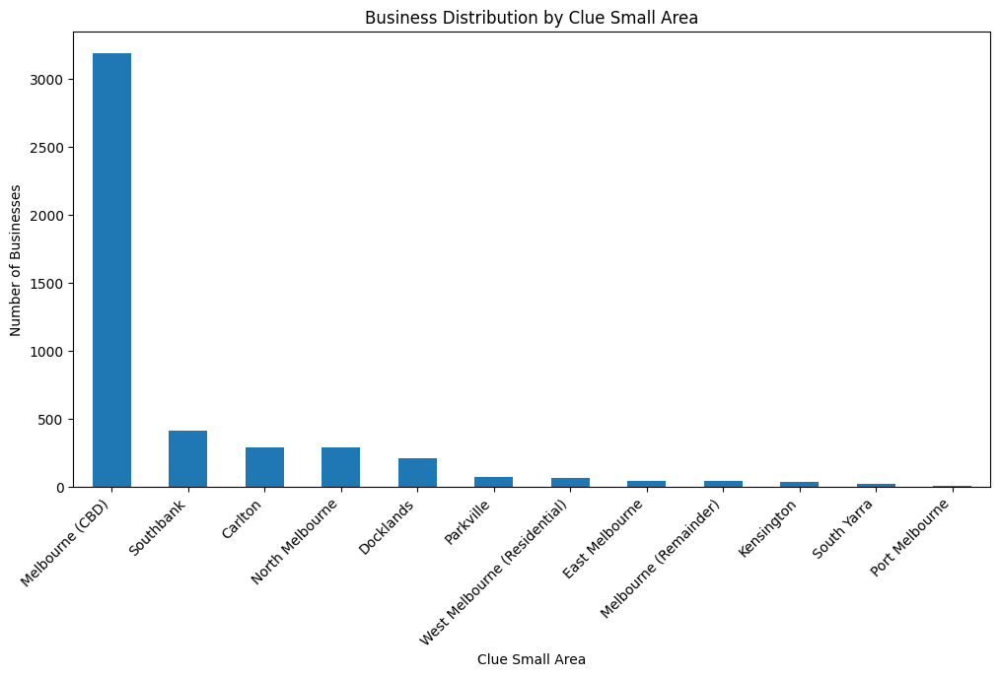

In [9]:
#Plotting Business Distribution by Clue Small Area

import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
df_business['clue_small_area'].value_counts().plot(kind='bar')
plt.xlabel('Clue Small Area')
plt.ylabel('Number of Businesses')
plt.title('Business Distribution by Clue Small Area')
_ = plt.xticks(rotation=45, ha='right')


The bar chart shows the number of bars, pubs, and taverns in each CLUE small area. This helps in identifying which areas have a high concentration of businesses and which areas have fewer or no such establishments for example we can see that Melbourne(CBD) has the highest number of businesses.

In [11]:
#Function to filter map based on Clue Small Area
def create_map(clue_area):
    # Filter the DataFrame based on the selected CLUE area
    filtered_df = df_business[df_business['clue_small_area'] == clue_area]

    # Create the map centered on the average location
    map_center = [filtered_df['latitude'].mean(), filtered_df['longitude'].mean()]
    m = folium.Map(location=map_center, zoom_start=13)

    # Add markers for each business location
    for idx, row in filtered_df.iterrows():
        folium.Marker(
            location=[row['latitude'], row['longitude']],
            popup=f"{row['trading_name']}<br>{row['business_address']}",
            tooltip=row['trading_name']
        ).add_to(m)

    # Display the map
    display(m)


# Get the unique CLUE areas for the dropdown
clue_areas = df_business['clue_small_area'].unique()

# Use ipywidgets to create an interactive dropdown
interact(create_map, clue_area=clue_areas)


interactive(children=(Dropdown(description='clue_area', options=('Melbourne (CBD)', 'Carlton', 'Parkville', 'N…

<function __main__.create_map(clue_area)>

By visualizing the business locations on a map with a dropdown filter based on CLUE small area, the purpose is to allow users (such as city planners or business owners) to interactively explore specific geographic areas and analyze the concentration of businesses in those regions. This filter helps narrow down the map view to individual areas, making it easier to focus on local business distribution and assess public transport accessibility for each area.

**Exploring the bus stop dataset**

In [15]:
df_bus_stop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309 entries, 0 to 308
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   geo_point_2d  309 non-null    object 
 1   geo_shape     309 non-null    object 
 2   prop_id       309 non-null    int64  
 3   addresspt1    309 non-null    float64
 4   addressp_1    309 non-null    int64  
 5   asset_clas    309 non-null    object 
 6   asset_type    309 non-null    object 
 7   objectid      309 non-null    int64  
 8   str_id        309 non-null    int64  
 9   addresspt     309 non-null    int64  
 10  asset_subt    0 non-null      float64
 11  model_desc    309 non-null    object 
 12  mcc_id        309 non-null    int64  
 13  roadseg_id    309 non-null    int64  
 14  descriptio    309 non-null    object 
 15  model_no      309 non-null    object 
dtypes: float64(2), int64(7), object(7)
memory usage: 38.8+ KB


In [16]:
# Ensure the column is of type string
df_bus_stop['geo_point_2d'] = df_bus_stop['geo_point_2d'].astype(str)

# Split 'geo_point_2d' into 'latitude' and 'longitude'
df_bus_stop[['latitude', 'longitude']] = df_bus_stop['geo_point_2d'].str.split(', ', expand=True)

# Convert the new columns to float
df_bus_stop['latitude'] = df_bus_stop['latitude'].astype(float)
df_bus_stop['longitude'] = df_bus_stop['longitude'].astype(float)

In [17]:
# Drop the original 'geo_point_2d' column
df_bus_stop.drop('geo_point_2d', axis=1, inplace=True)

# Keep only the 'description', 'model_desc', 'latitude', and 'longitude' columns
df_bus_stop = df_bus_stop[['descriptio', 'model_desc', 'latitude', 'longitude']]

In [18]:
df_bus_stop.head(5)

,descriptio,model_desc,latitude,longitude
0,Sign - Public Transport 1 Panel Bus Stop Type 13,Sign - Public Transport 1 Panel,-37.803842,144.932393
1,Sign - Public Transport 1 Panel Bus Stop Type 8,Sign - Public Transport 1 Panel,-37.815487,144.958179
2,Sign - Public Transport 1 Panel Bus Stop Type 8,Sign - Public Transport 1 Panel,-37.813539,144.957283
3,Sign - Public Transport 1 Panel Bus Stop Type 8,Sign - Public Transport 1 Panel,-37.821914,144.955393
4,Sign - Public Transport 1 Panel Bus Stop Type 8,Sign - Public Transport 1 Panel,-37.833164,144.974437


**Exploring the tram tracks dataset**

In [19]:
df_tram_tracks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 645 entries, 0 to 644
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   geo_point_2d  645 non-null    object
 1   geo_shape     645 non-null    object
 2   descriptio    645 non-null    object
 3   name          645 non-null    object
dtypes: object(4)
memory usage: 20.3+ KB


In [20]:
# Ensure the column is of type string
df_tram_tracks['geo_point_2d'] = df_tram_tracks['geo_point_2d'].astype(str)

# Split 'geo_point_2d' into 'latitude' and 'longitude'
df_tram_tracks[['latitude', 'longitude']] = df_tram_tracks['geo_point_2d'].str.split(', ', expand=True)

# Convert the new columns to float
df_tram_tracks['latitude'] = df_tram_tracks['latitude'].astype(float)
df_tram_tracks['longitude'] = df_tram_tracks['longitude'].astype(float)

In [21]:
# Drop the original 'geo_point_2d' column if no longer needed
df_tram_tracks.drop('geo_point_2d', axis=1, inplace=True)
df_tram_tracks.drop('geo_shape', axis=1, inplace=True)

In [22]:
df_tram_tracks.head(5) #overview of the tram tracks dataset

,descriptio,name,latitude,longitude
0,<center><table><tr><th colspan='2' align='cent...,kml_3,-37.788613,144.934616
1,<center><table><tr><th colspan='2' align='cent...,kml_5,-37.819186,144.961035
2,<center><table><tr><th colspan='2' align='cent...,kml_6,-37.818380,144.959453
3,<center><table><tr><th colspan='2' align='cent...,kml_7,-37.814404,144.970251
4,<center><table><tr><th colspan='2' align='cent...,kml_8,-37.816739,144.969909


In [33]:
import folium

# Create a base map centered on an average location (adjust latitude and longitude for your dataset)
map_center = [df_business['latitude'].mean(), df_business['longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=12)

# Add markers for each business location
for idx, row in df_business.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"{row['trading_name']}<br>{row['business_address']}",
        tooltip=row['trading_name'],
        icon=folium.Icon(color='red', icon='info-sign')  # Customize business markers
    ).add_to(m)

# Add markers for bus stops (assuming bus_stops DataFrame has latitude and longitude columns)
for idx, row in df_bus_stop.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"Bus Stop: {row['model_desc']}",
        icon=folium.Icon(color='blue', icon='bus')  # Customize bus stop markers
    ).add_to(m)

# Add markers for tram stops (assuming tram_stops DataFrame has latitude and longitude columns)
for idx, row in df_tram_tracks.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"Tram Stop: {row['name']}",
        icon=folium.Icon(color='green', icon='train')  # Customize tram stop markers
    ).add_to(m)

# Display the map
m


The visualisation of this map integrates all available datasets, including the bars, cafes and oubs dataset, bus stops, and tram tracks, to create a comprehensive map showcasing the spatial distribution of these elements. By combining these datasets into a single map, the analysis provides an overview of the entire transportation and support service landscape in the area of interest.



In [37]:
import numpy as np

# Function to calculate Haversine distance in meters
def haversine(lat1, lon1, lat2, lon2):
    R = 6371000  # Radius of Earth in meters
    phi1 = np.radians(lat1)
    phi2 = np.radians(lat2)
    delta_phi = np.radians(lat2 - lat1)
    delta_lambda = np.radians(lon2 - lon1)

    a = np.sin(delta_phi / 2.0) ** 2 + np.cos(phi1) * np.cos(phi2) * np.sin(delta_lambda / 2.0) ** 2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))

    return R * c  # Distance in meters


In [39]:
# Add columns for nearest bus stop and tram stop distances
df_business['nearest_bus_stop'] = np.inf  # Initialize with a large number
df_business['nearest_tram_stop'] = np.inf

# Calculate distance from each business to the nearest bus stop
for i, business in df_business.iterrows():
    # Calculate distance to each bus stop and find the minimum distance
    distances_bus = df_bus_stop.apply(
        lambda x: haversine(business['latitude'], business['longitude'], x['latitude'], x['longitude']),
        axis=1
    )
    df_business.at[i, 'nearest_bus_stop'] = distances_bus.min()

    # Calculate distance to each tram stop and find the minimum distance
    distances_tram = df_tram_tracks.apply(
        lambda x: haversine(business['latitude'], business['longitude'], x['latitude'], x['longitude']),
        axis=1
    )
    df_business.at[i, 'nearest_tram_stop'] = distances_tram.min()


# **Finding the nearest public transport to the business locations**

In this section, we are finding the nearest bus stop and tram stop to the support services.  The map draws paths from services to their nearest stops, providing a visual connection for accessibility.


In [ ]:
from math import radians, sin, cos, sqrt, atan2


# Function to calculate distance between two points
def haversine_distance(lat1, lon1, lat2, lon2):
    # Convert latitude and longitude from degrees to radians
    lat1, lon1, lat2, lon2 = radians(lat1), radians(lon1), radians(lat2), radians(lon2)

    # Haversine formula
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = sin(dlat / 2) ** 2 + cos(lat1) * cos(lat2) * sin(dlon / 2) ** 2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))
    r = 6371  # Radius of Earth in kilometers
    distance = r * c

    return distance

# Iterate over each business service and calculate the distance to the nearest bus stop
for index, service_row in df_business.iterrows():
    nearest_distance = float('inf')  # Initialize with a large value
    for stop_index, stop_row in df_bus_stop.iterrows():
        distance = haversine_distance(service_row['lat'], service_row['lon'],
                                       stop_row['lat'], stop_row['lon'])
        if distance < nearest_distance:
            nearest_distance = distance
    # Update the support service DataFrame with the nearest distance to a bus stop
    df_business.at[index, 'nearest_bus_stop_distance'] = nearest_distance

# Iterate over each business service and calculate the distance to the nearest tram stop
for index, service_row in df_business.iterrows():
    nearest_distance = float('inf')  # Initialize with a large value
    for stop_index, stop_row in df_tram_tracks.iterrows():
        distance = haversine_distance(service_row['lat'], service_row['lon'],
                                       stop_row['lat'], stop_row['lon'])
        if distance < nearest_distance:
            nearest_distance = distance
    # Update the business location DataFrame with the nearest distance to a tram
    # stop
    df_business.at[index, 'nearest_tram_track_distance'] = nearest_distance


This code calculates the distance from each support service location to the nearest bus stop and tram track using the Haversine formula to account for the Earth's curvature. It iterates through each business location and calculates the distance to each bus stop and tram track, updating the DataFrame with the nearest distances. This information can be used for mapping and analysis, providing insights into the accessibility of support services via public transport.

In [ ]:
# Normalize the nearest bus stop distance
df_business['normalized_bus_stop_distance'] = (df_business['nearest_bus_stop_distance'] - df_business['nearest_bus_stop_distance'].min()) / (df_business['nearest_bus_stop_distance'].max() - df_business['nearest_bus_stop_distance'].min())

# Normalize the nearest tram track distance
df_business['normalized_tram_track_distance'] = (df_business['nearest_tram_track_distance'] - df_business['nearest_tram_track_distance'].min()) / (df_business['nearest_tram_track_distance'].max() - df_business['nearest_tram_track_distance'].min())

# Combine these normalized distances into a single accessibility score
df_business['accessibility_score'] = (df_business['normalized_bus_stop_distance'] + df_business['normalized_tram_track_distance']) / 2


In [ ]:
import folium

# Create a base map
melbourne_map = folium.Map(location=[-37.8136, 144.9631], zoom_start=12)

# Add business locations to the map
for idx, row in df_business.iterrows():
    folium.CircleMarker(location=[row['latitude'], row['longitude']],
                        radius=5,
                        popup=f"Accessibility Score: {row['accessibility_score']:.2f}",
                        color='blue' if row['accessibility_score'] > 0.5 else 'red',
                        fill=True).add_to(melbourne_map)

# Display the map
melbourne_map



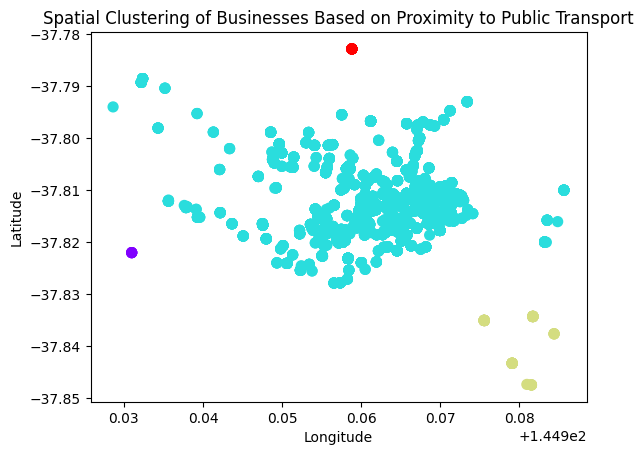

In [ ]:
from sklearn.cluster import DBSCAN
import numpy as np

coords = df_business[['latitude', 'longitude']].to_numpy()
db = DBSCAN(eps=0.01, min_samples=5).fit(coords)
df_business['cluster'] = db.labels_

# Plotting clusters
plt.scatter(df_business['longitude'], df_business['latitude'], c=df_business['cluster'], cmap='rainbow', s=50)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Spatial Clustering of Businesses Based on Proximity to Public Transport')
plt.show()
